In [2]:
import os
import pathlib
import numpy as np
import imageio
import glob
import matplotlib.pyplot as plt
import IPython.display
import PIL.Image
from PIL import Image
from math import sqrt
import imageio
import cv2
import scipy.ndimage as nd
from itertools import chain

In [2]:
# Relative paths to the notebook
baboon = cv2.imread('images/baboon.pgm',cv2.IMREAD_GRAYSCALE)

output_path = 'outputs/'
# If output folder does not exist, create it
p = pathlib.Path(output_path)
if not p.is_dir():
    p.mkdir()

Floyd Steinberg

In [3]:
def floyd_steinberg_order1(img):
    T = 128
    n = img.shape[0]
    m = img.shape[1]
    
    output = img.copy()
    
    for i in range(n):
        for j in range(m):
            v_pixel = output[i,j]
            
            if v_pixel > T:
                error = v_pixel - 255
                output[i,j] = 255
            else:
                error = v_pixel - 0
                output[i,j] = 0
            
            e1 = np.round(error * (7.0 / 16.0))
            e2 = np.round(error * (3.0 / 16.0))
            e3 = np.round(error * (5.0 / 16.0))
            e4 = np.round(error * (1.0 / 16.0))
            
            if j+1 < m:
                output[i,j+1] = output[i,j+1] + e1
            if i+1 < n and j-1 >= 0:
                output[i+1,j-1] = output[i+1,j-1] + e2
            if i+1 < n:
                output[i+1,j] = output[i+1,j] + e3
            if i+1 < n and j+1 < m:
                output[i+1,j+1] = output[i+1,j+1] + e4
    
    return output


In [4]:
def floyd_steinberg_order2(img):
    T = 128
    n = img.shape[0]
    m = img.shape[1]
    
    output = img.copy()
    
    flag = True
    
    for i in range(n):
        if flag:
            for j in range(m):
                v_pixel = output[i,j]

                if v_pixel > T:
                    error = v_pixel - 255
                    output[i,j] = 255
                else:
                    error = v_pixel - 0
                    output[i,j] = 0

                e1 = np.round(error * (7.0 / 16.0))
                e2 = np.round(error * (3.0 / 16.0))
                e3 = np.round(error * (5.0 / 16.0))
                e4 = np.round(error * (1.0 / 16.0))

                if j+1 < m:
                    output[i,j+1] = output[i,j+1] + e1
                if i+1 < n and j-1 >= 0:
                    output[i+1,j-1] = output[i+1,j-1] + e2
                if i+1 < n:
                    output[i+1,j] = output[i+1,j] + e3
                if i+1 < n and j+1 < m:
                    output[i+1,j+1] = output[i+1,j+1] + e4
            flag = False
        else:
            for j in range(m-1,-1,-1):
                v_pixel = output[i,j]

                if v_pixel > T:
                    error = v_pixel - 255
                    output[i,j] = 255
                else:
                    error = v_pixel - 0
                    output[i,j] = 0

                e1 = np.round(error * (7.0 / 16.0))
                e2 = np.round(error * (3.0 / 16.0))
                e3 = np.round(error * (5.0 / 16.0))
                e4 = np.round(error * (1.0 / 16.0))

                if j-1 >= 0:
                    output[i,j-1] = output[i,j-1] + e1
                if i+1 < n and j+1 < m:
                    output[i+1,j+1] = output[i+1,j+1] + e2
                if i+1 < n:
                    output[i+1,j] = output[i+1,j] + e3
                if i+1 < n and j-1 >= 0:
                    output[i+1,j-1] = output[i+1,j-1] + e4
            flag = True
    return output


In [5]:
def plotting_image_and_floyd(image,floyd):
    f = plt.figure()
    
    f.add_subplot(1,2,1)
    plt.imshow(image,'gray')
    
    f.add_subplot(1,2,2)
    plt.imshow(floyd,'gray')
    
    plt.show()


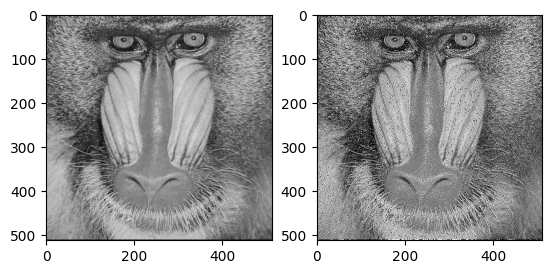

In [6]:
baboon_floyd_order1 = floyd_steinberg_order1(baboon)
baboon_floyd_order2 = floyd_steinberg_order2(baboon)



# resultado do floyd-steinberg com a ordem 1
plotting_image_and_floyd(baboon,baboon_floyd_order1)

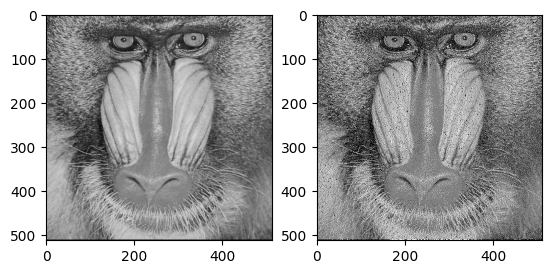

In [7]:
# resultado do floyd-steinberg com a ordem 2
plotting_image_and_floyd(baboon,baboon_floyd_order2)

## BANDA DE COR

In [1]:
import cv2
import Ditherer as dith
import tkinter as tk
from tkinter import filedialog
from tkinter import messagebox

root = tk.Tk()
root.withdraw()

found_image = 0
while found_image == 0:
    try:
        file_path = filedialog.askopenfilename()
        image = cv2.imread(file_path)
        found_image = 1
    except:
        print('Incorrect file type. Only accepts pictures.')

ditherer = dith.Steinberg(image)
options = ['1', '2']
choice = ''
print('Choose dithering method: ')
while choice not in options:
    print('\t1. Two-Tone')
    print('\t2. RGB')
    choice = input('Choice: ')
if choice == '1':
    ditherer.dither2Tone()
elif choice == '2':
    ditherer.dither()
print('Done')
ditherer.show()

Choose dithering method: 
	1. Two-Tone
	2. RGB
	1. Random Palette
	2. Selective Palette

Loading...
Done


Only C and default locale supported with the posix collation implementation
Only C and default locale supported with the posix collation implementation
Case insensitive sorting unsupported in the posix collation implementation
Numeric mode unsupported in the posix collation implementation
Only C and default locale supported with the posix collation implementation
Only C and default locale supported with the posix collation implementation
Case insensitive sorting unsupported in the posix collation implementation
Numeric mode unsupported in the posix collation implementation
Only C and default locale supported with the posix collation implementation
Only C and default locale supported with the posix collation implementation
Case insensitive sorting unsupported in the posix collation implementation
Numeric mode unsupported in the posix collation implementation


#### Filtragem no Dominio de Frequencia

In [3]:
from skimage import io
from skimage import color
from skimage.restoration import denoise_nl_means, estimate_sigma

import numpy as np
from numpy.fft import fft, fftfreq, ifft

from scipy import ndimage as nd
from scipy.fft import fft, ifft
from scipy import fftpack

from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import time
import cv2
from math import sqrt
from math import exp



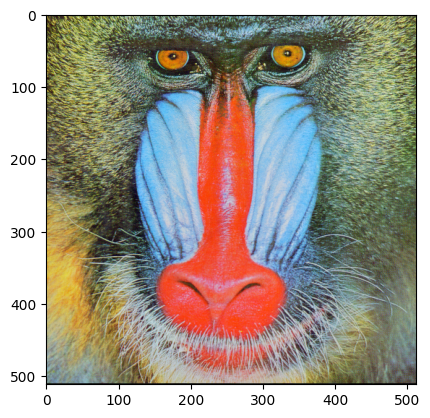

In [4]:
img = io.imread("images/baboon.png")
plt.imshow(img)
plt.show()

/tmp/ipykernel_61509/2329610349.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  plt.imshow(img_fft.astype(np.uint8))


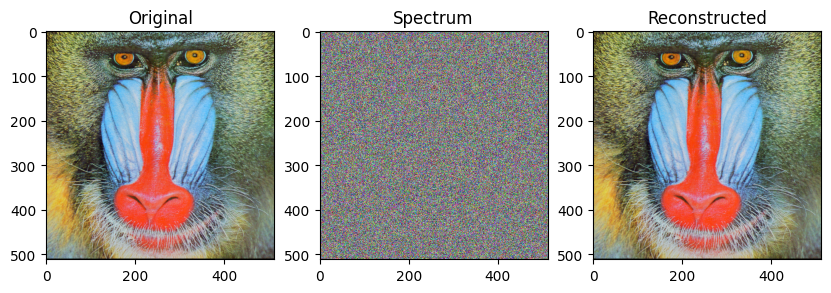

In [5]:


# https://scipy-lectures.org/intro/scipy/auto_examples/solutions/plot_fft_image_denoise.html

# fft
img_fft =  fftpack.fft2(img)


# inverse of signal
img_ifft = fftpack.ifft2(img_fft).real

plt.figure(figsize=(10,10))

plt.subplot(131)
plt.imshow(img)
plt.title("Original")

plt.subplot(132)
plt.title("Spectrum")
plt.imshow(img_fft.astype(np.uint8))
plt.subplot(133)

plt.title("Reconstructed")
plt.imshow(img_ifft.astype(np.uint8))
plt.show()



### FILTRO PASSA BAIXA

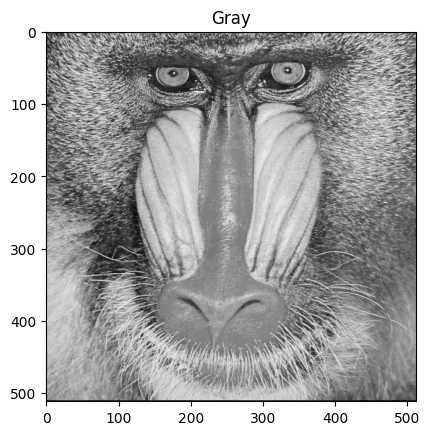

In [6]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
img = rgb2gray(img)

plt.imshow(img,cmap="gray")
plt.title("Gray")
plt.show()

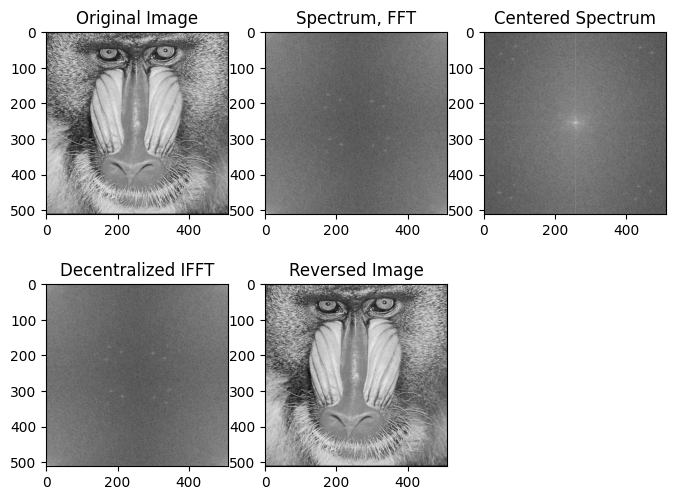

In [7]:
plt.figure(figsize=(8, 6), constrained_layout=False)


img_fft = np.fft.fft2(img)
img_fftshift = np.fft.fftshift(img_fft)
img_ifftshit = np.fft.ifftshift(img_fftshift)
img_ifft = np.fft.ifft2(img_ifftshit)

plt.subplot(231), plt.imshow(img, "gray"), plt.title("Original Image")
plt.subplot(232), plt.imshow(np.log(1+np.abs(img_fft)), "gray"), plt.title("Spectrum, FFT")
plt.subplot(233), plt.imshow(np.log(1+np.abs(img_fftshift)), "gray"), plt.title("Centered Spectrum")
plt.subplot(234), plt.imshow(np.log(1+np.abs(img_ifftshit)), "gray"), plt.title("Decentralized IFFT")
plt.subplot(235), plt.imshow(np.abs(img_ifft), "gray"), plt.title("Reversed Image")

plt.show()

In [8]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

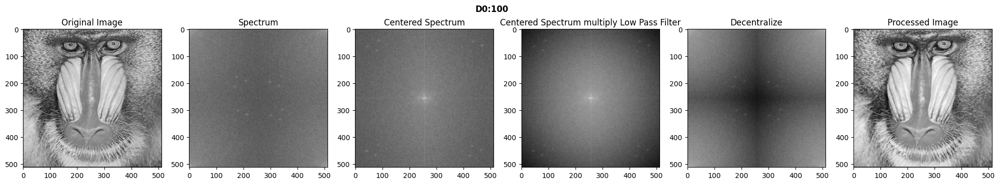

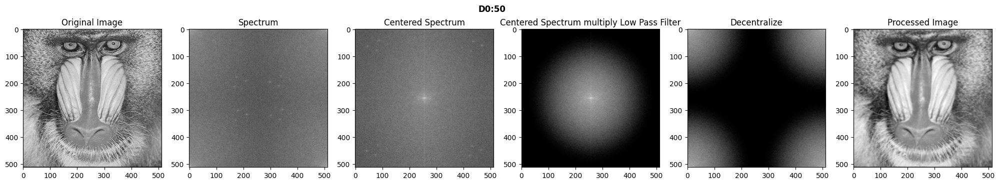

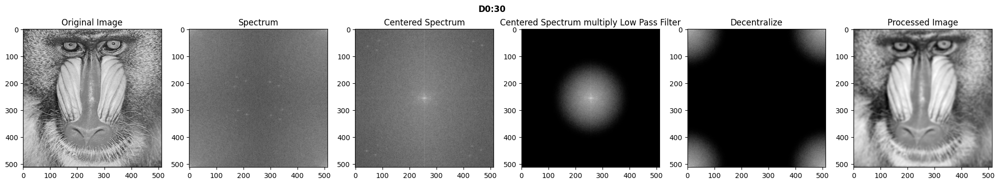

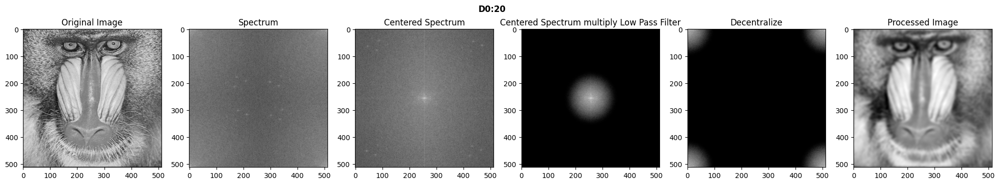

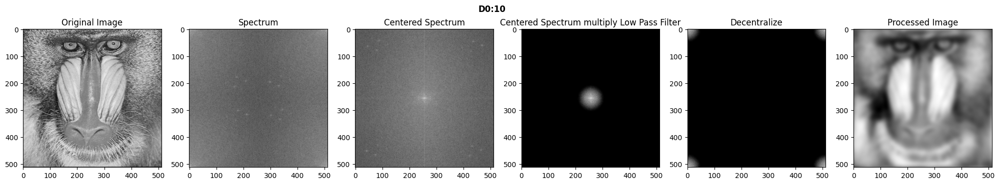

In [9]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * gaussianLP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_lp(i)

### FILTRO PASSA ALTA

In [10]:
def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

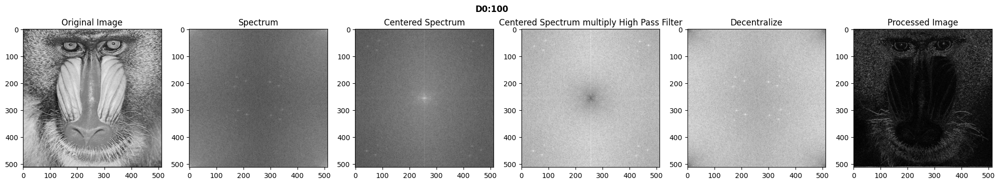

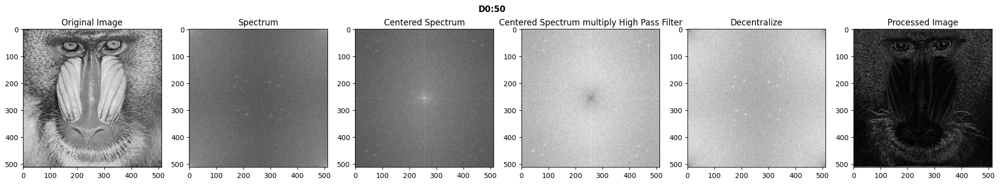

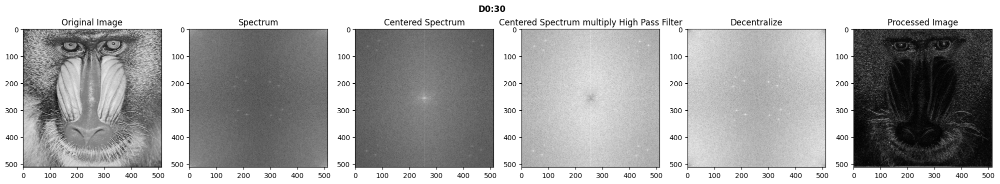

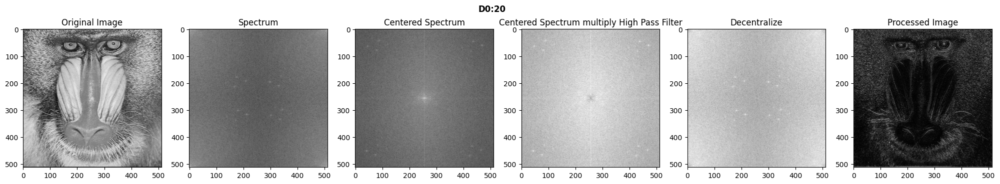

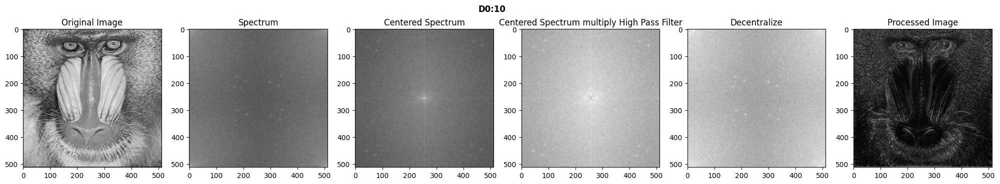

In [11]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * gaussianHP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()
    
    
for i in [100,50,30,20,10]:
    try_d0s_hp(i)

### FILTRO PASSA FAIXA

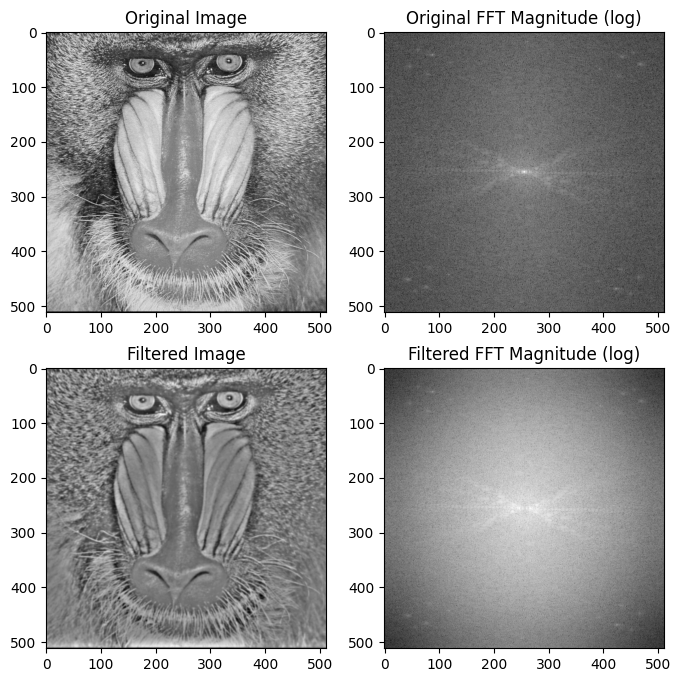

In [12]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.data import gravel
from skimage.filters import difference_of_gaussians, window
from scipy.fft import fftn, fftshift

image = img
wimage = image * window('hann', image.shape)  # window image to improve FFT
filtered_image = difference_of_gaussians(image, 1, 12)
filtered_wimage = filtered_image * window('hann', image.shape)
im_f_mag = fftshift(np.abs(fftn(wimage)))
fim_f_mag = fftshift(np.abs(fftn(filtered_wimage)))

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(np.log(im_f_mag), cmap='gray')
ax[0, 1].set_title('Original FFT Magnitude (log)')
ax[1, 0].imshow(filtered_image, cmap='gray')
ax[1, 0].set_title('Filtered Image')
ax[1, 1].imshow(np.log(fim_f_mag), cmap='gray')
ax[1, 1].set_title('Filtered FFT Magnitude (log)')
plt.show()

### FILTRO REJEITA FAIXA

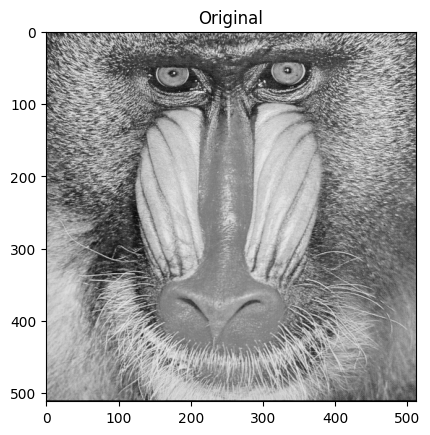

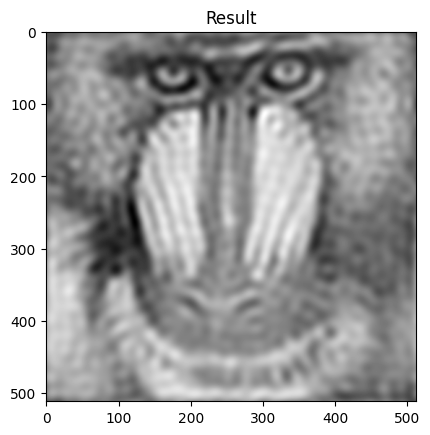

In [20]:
from scipy import fftpack
import numpy as np
import imageio
from PIL import Image, ImageDraw

image1 = img
#convert image to numpy array
image1_np=np.array(image1)

#fft of image
fft1 = fftpack.fftshift(fftpack.fft2(image1_np))

#Create a low pass filter image
x,y = image1_np.shape[0],image1_np.shape[1]
#size of circle
e_x,e_y=50,50
#create a box 
bbox=((x/2)-(e_x/2),(y/2)-(e_y/2),(x/2)+(e_x/2),(y/2)+(e_y/2))

low_pass=Image.new("L",(image1_np.shape[0],image1_np.shape[1]),color=0)

draw1=ImageDraw.Draw(low_pass)
draw1.ellipse(bbox, fill=1)

low_pass_np=np.array(low_pass)

#multiply both the images
filtered=np.multiply(fft1,low_pass_np)

#inverse fft
ifft2 = np.real(fftpack.ifft2(fftpack.ifftshift(filtered)))
ifft2 = np.maximum(0, np.minimum(ifft2, 255))

plt.plot(222)
plt.imshow(img, cmap='gray')
plt.title('Original')
plt.show()

plt.plot(224)
plt.imshow(ifft2, "gray") 
plt.title("Result")
plt.show()

### COMPRESSÃO

In [23]:
def IFFT(arr):
    ''' Recursive Inverse Fast Fourier Transformation implementation 
    '
    '   Arguments: arr - 1d numpy array
    '   Return: 1d numpy array
    '''
    return FFT(arr, inverse=True) / arr.shape[0]


def FFT(arr, inverse=False):
    ''' Recursive Fast Fourier Transformation implementation
    '
    '   Arguments: arr - 1d numpy array, inverse - Boolean
    '   Return: 1d numpy array
    '''
    sign = 1 if inverse else -1

    if arr.shape[0] == 1:
        # Return the array of lenght 1
        return arr
    else:
        # Recursively run FFT for even and odd arr's elements
        even, odd = FFT(arr[0::2], inverse=inverse), FFT(arr[1::2],
                                                         inverse=inverse)

        # Calculate the omega value
        omega = sign * 2j * np.pi / arr.shape[0]

        # Calculate the range of values
        values = np.exp(omega * np.arange(arr.shape[0] // 2)) * odd

        return np.concatenate([even + values, even - values])

def compress(img):
    ''' Compress img using FFT and IFFT
    '
    '   Arguments: img - 2d numpy array
    '   Return: 2d numpy array
    '''
    # Do 2D FFT
    img = np.apply_along_axis(FFT, 1, img)
    img = np.apply_along_axis(FFT, 0, img)

    # Drop some values
    img[img < np.mean(img) - 13 * np.std(img)] = 0

    # Do 2D IFFT
    img = np.apply_along_axis(IFFT, 1, img)
    img = np.apply_along_axis(IFFT, 0, img)

    # Return real values of img
    return np.real(img)

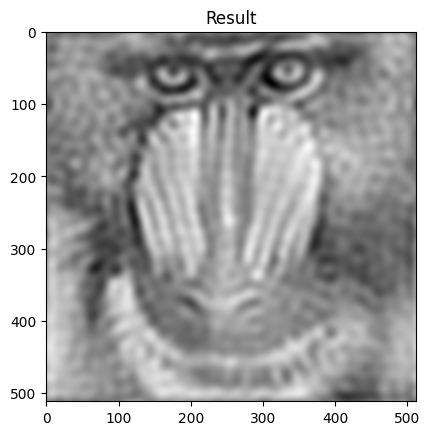

In [32]:
img_compress = compress(ifft2)
plt.plot(224)
plt.imshow(img_compress, "gray") 
plt.title("Result")
plt.show()

### HISTOGRAMAS

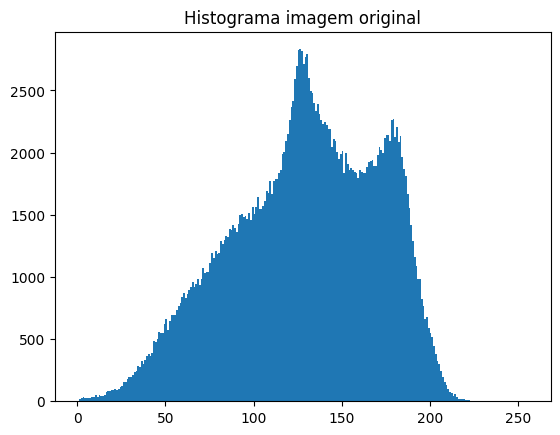

In [36]:
import cv2
from matplotlib import pyplot as plt
img = cv2.imread('images/baboon.pgm',0)
  
# alternative way to find histogram of an image
plt.hist(img.ravel(),256,[0,256])
plt.title("Histograma imagem original")
plt.show()

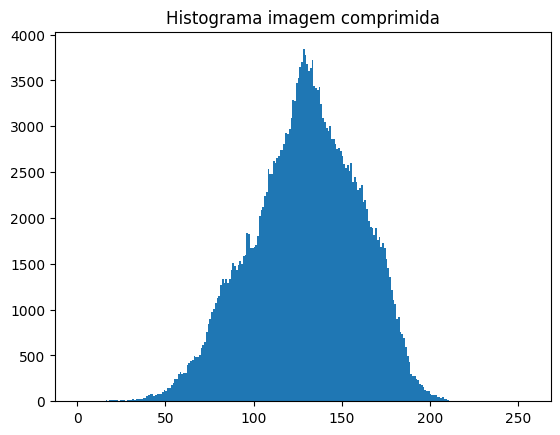

In [37]:
img = img_compress
  
# alternative way to find histogram of an image
plt.hist(img.ravel(),256,[0,256])
plt.title("Histograma imagem comprimida")
plt.show()